### **Positive sentences in reviews**

In [1]:
%%capture
!pip install -r ../requirements.txt

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px
import unicodedata
import fasttext
import re
import nltk
import pickle
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from wordcloud import WordCloud

In [3]:
# Created from sentences_classification.ipynb
df_positive_sentences = pd.read_csv('../data/processed/positive_sentences.csv')

In [4]:
tfile = open('positive_sentences.txt', 'a')
tfile.write(df_positive_sentences['text_processed'].to_string())
tfile.close()

In [5]:
model = fasttext.train_unsupervised('positive_sentences.txt')

Read 0M words
Number of words:  6353
Number of labels: 0
Progress: 100.0% words/sec/thread:   61228 lr:  0.000000 avg.loss:  2.205300 ETA:   0h 0m 0s


In [6]:
df_positive_sentences['vec'] = df_positive_sentences['text_processed'].apply(lambda x: model.get_sentence_vector(str(x)))

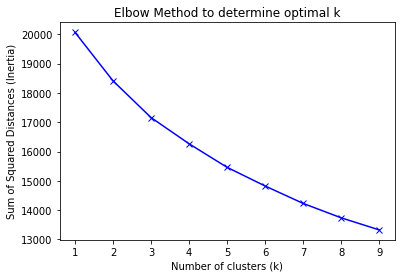

In [7]:
sum_squared_distances = []

K = range(1,10)
for num_clusters in K :
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(df_positive_sentences['vec'].values.tolist())
    sum_squared_distances.append(kmeans.inertia_)

plt.plot(K, sum_squared_distances, 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Sum of Squared Distances (Inertia)')
plt.title('Elbow Method to determine optimal k')
plt.show()

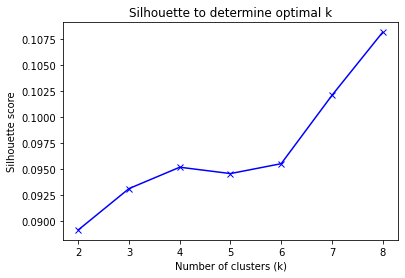

In [8]:
n_clusters_range = [2, 3, 4, 5, 6, 7, 8]
silhouette_avg = []

for num_clusters in n_clusters_range:

    # fit Kmeans
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(df_positive_sentences['vec'].values.tolist())
    cluster_labels = kmeans.labels_

    # calculate silhouette
    silhouette_avg.append(silhouette_score(df_positive_sentences['vec'].values.tolist(), cluster_labels))

plt.plot(n_clusters_range, silhouette_avg, 'bx-')    
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette score')
plt.title('Silhouette to determine optimal k')
plt.show()

In [9]:
kmeans = KMeans(n_clusters=8)

In [10]:
df_positive_sentences['cluster'] = kmeans.fit_predict(df_positive_sentences['vec'].values.tolist())

In [11]:
def generate_wordcloud(df):
    text = ' '.join([str(i) for i in df['text_processed']])
    wordcloud = WordCloud(max_words=100, background_color='Black').generate(text)
    plt.figure(figsize=(12,12))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.show()

##### **Cluster 0**

In [12]:
cluster_0 = df_positive_sentences[df_positive_sentences['cluster']==0]

In [67]:
cluster_0 = cluster_0.drop(columns=['Unnamed: 0', 'label'])

In [70]:
cluster_0.sample(5)

,text,review_index,text_processed,vec,cluster
64210,Las habitaciones están al mismo nivel: grandes...,4_538,habitaciones mismo nivel grandes comodas limpias,"[-0.088350736, 0.13169247, -0.024463264, 0.061...",0
3062,Hotel bonito,5_561,bonito,"[-0.13446948, 0.22493374, 0.087596856, 0.11192...",0
74313,"Nos alojamos en una habitación cuádruple, con ...",4_2804,alojamos habitacion cuadruple bano precioso,"[-0.13608144, 0.16087033, 0.046268202, 0.05105...",0
1306,"Maravilloso hotel, bien ubicado, con habitacio...",5_248,maravilloso bien ubicado habitaciones bano gra...,"[-0.111269616, 0.09629312, -0.0058020013, 0.06...",0
8908,"Las habitaciones son amplias y cómodas, El pe...",5_1604,habitaciones amplias comodas personal agradabl...,"[-0.13675666, 0.21154177, -0.059547596, 0.0486...",0


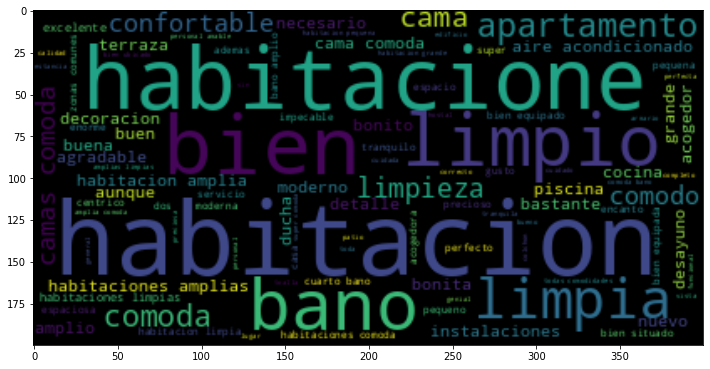

In [14]:
generate_wordcloud(cluster_0)

In [15]:
df_positive_sentences.loc[df_positive_sentences['cluster']==0, 'cluster'] = 'cleanliness and comfort'

In [16]:
n_sentences_c0 = len(cluster_0)
n_sentences = len(df_positive_sentences)
n_comments_c0 = cluster_0['review_index'].nunique()
n_comments = df_positive_sentences['review_index'].nunique()
perc_sentences_c0 = round(100*(n_sentences_c0/n_sentences))
perc_comments_c0 = round(100*(n_comments_c0/n_comments))

In [17]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 0: {n_sentences_c0}')
print(f'Percentage of sentences belonging to cluster 0: {perc_sentences_c0}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 0: {n_comments_c0}')
print(f'Percentage of comments that include sentences belonging to cluster 0: {perc_comments_c0}')

Total number of sentences (all clusters): 80885
Number of sentences belonging to cluster 0: 11503
Percentage of sentences belonging to cluster 0: 14
Total number of comments: 16013
Number of comments that include sentences belonging to cluster 0: 8074
Percentage of comments that include sentences belonging to cluster 0: 50


##### **Cluster 1**

In [18]:
cluster_1 = df_positive_sentences[df_positive_sentences['cluster']==1]

In [ ]:
cluster_1 = cluster_1.drop(columns=['Unnamed: 0', 'label'])

In [66]:
cluster_1.sample(5)

,text,review_index,text_processed,vec,cluster
46359,"El trato y las atenciones, inmejorables",5_8007,trato atenciones inmejorables,"[-0.124789834, 0.23887098, 0.052619882, -0.001...",1
41592,Gracias por vuestra amabilidad,5_7240,gracias amabilidad,"[-0.06544263, 0.25704664, -0.097393066, -0.052...",1
4893,"Teresa, el director, era de lo más servicial c...",5_889,teresa director servicial direcciones llamando...,"[-0.17411682, 0.29688278, -0.046345584, -0.044...",1
62389,"El repecionista que nos atendió, muy amable",4_107,repecionista atendio amable,"[-0.19888215, 0.36354193, -0.046915796, -0.083...",1
39178,"Las instalaciones excelentes, y el personal mu...",5_6860,instalaciones excelentes personal profesional ...,"[-0.14114131, 0.25126824, -0.04256443, -0.0021...",1


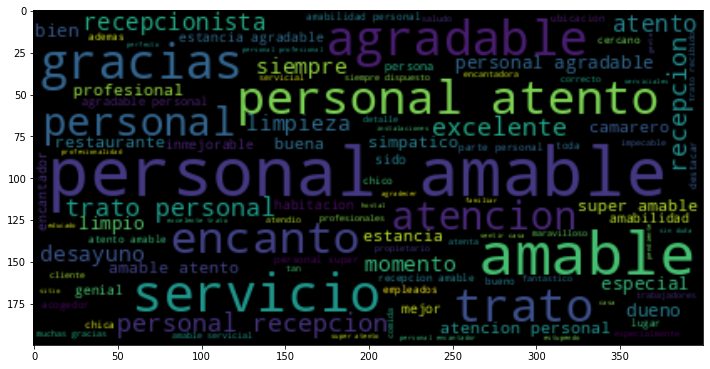

In [20]:
generate_wordcloud(cluster_1)

In [94]:
df_positive_sentences.loc[df_positive_sentences['cluster']==1, 'cluster'] = 'kind staff'

In [22]:
n_sentences_c1 = len(cluster_1)
n_comments_c1 = cluster_1['review_index'].nunique()
perc_sentences_c1 = round(100*(n_sentences_c1/n_sentences))
perc_comments_c1 = round(100*(n_comments_c1/n_comments))

In [23]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 1: {n_sentences_c1}')
print(f'Percentage of sentences belonging to cluster 1: {perc_sentences_c1}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 1: {n_comments_c1}')
print(f'Percentage of comments that include sentences belonging to cluster 1: {perc_comments_c1}')

Total number of sentences (all clusters): 80885
Number of sentences belonging to cluster 1: 8384
Percentage of sentences belonging to cluster 1: 10
Total number of comments: 16013
Number of comments that include sentences belonging to cluster 1: 6688
Percentage of comments that include sentences belonging to cluster 1: 42


##### **Cluster 2**

In [24]:
cluster_2 = df_positive_sentences[df_positive_sentences['cluster']==2]

In [71]:
cluster_2 = cluster_2.drop(columns=['Unnamed: 0', 'label'])

In [75]:
cluster_2.sample(5)

,text,review_index,text_processed,vec,cluster
23575,El servico muy bueno y la ubicación inmejorable,5_4192,servico bueno ubicacion inmejorable,"[-0.07772854, 0.23740974, 0.107522875, 0.00243...",2
63651,Buen Hostel,4_399,buen hostel,"[-0.07185591, 0.22587146, 0.07430442, 0.038405...",2
11339,"comodidad máxima, en el Hotel por su ambiente ...",5_2029,comodidad maxima ambiente decorado ideal descanso,"[-0.046084225, 0.13913912, -0.012041214, 0.044...",2
34612,precio en los que he estado,5_6105,precio,"[-0.25690845, 0.33754367, 0.15438893, -0.06128...",2
9800,Genial,5_1754,genial,"[-0.08179646, 0.20471084, 0.12967697, 0.055978...",2


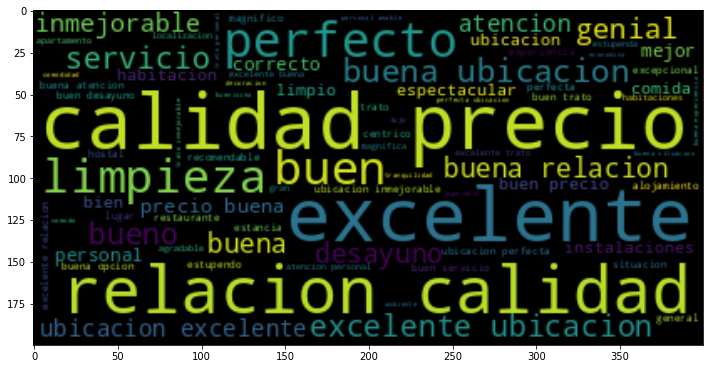

In [26]:
generate_wordcloud(cluster_2)

In [62]:
df_positive_sentences.loc[df_positive_sentences['cluster']==2, 'cluster'] = 'value for money'

In [28]:
n_sentences_c2 = len(cluster_2)
n_comments_c2 = cluster_2['review_index'].nunique()
perc_sentences_c2 = round(100*(n_sentences_c2/n_sentences))
perc_comments_c2 = round(100*(n_comments_c2/n_comments))

In [29]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 2: {n_sentences_c2}')
print(f'Percentage of sentences belonging to cluster 2: {perc_sentences_c2}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 2: {n_comments_c2}')
print(f'Percentage of comments that include sentences belonging to cluster 2: {perc_comments_c2}')

Total number of sentences (all clusters): 80885
Number of sentences belonging to cluster 2: 8651
Percentage of sentences belonging to cluster 2: 11
Total number of comments: 16013
Number of comments that include sentences belonging to cluster 2: 6681
Percentage of comments that include sentences belonging to cluster 2: 42


##### **Cluster 3**

In [30]:
cluster_3 = df_positive_sentences[df_positive_sentences['cluster']==3]

In [76]:
cluster_3 = cluster_3.drop(columns=['Unnamed: 0', 'label'])

In [82]:
cluster_3.sample(5)

,text,review_index,text_processed,vec,cluster
60618,Quede en primer lugar mi satisfacción por toda...,3_1885,quede primer lugar satisfaccion toda estancia ...,"[-0.12916361, 0.1852659, 0.03565073, 0.0071301...",3
67074,Todo muy cerca y el aparcamiento a pesar de se...,4_1183,cerca aparcamiento pesar ser pequeno comodo te...,"[-0.10463413, 0.15350766, 0.03928406, 0.016447...",3
79242,Eso sí de otras cosas saladas o dulces tienes ...,4_3880,cosas saladas dulces montadito manana anora re...,"[-0.17692135, 0.21702236, -0.019905481, -0.019...",3
916,"Es muy facil perderse entre sus instalaciones,...",5_170,facil perderse instalaciones tan lindo no importa,"[-0.024678312, 0.13618056, 0.01847693, -0.0043...",3
58107,"El desayuno ofrece un poco de todo, pero como ...",3_1106,desayuno ofrece demas ajusta precio pagamos me...,"[-0.093758054, 0.18150753, 0.049400713, -0.011...",3


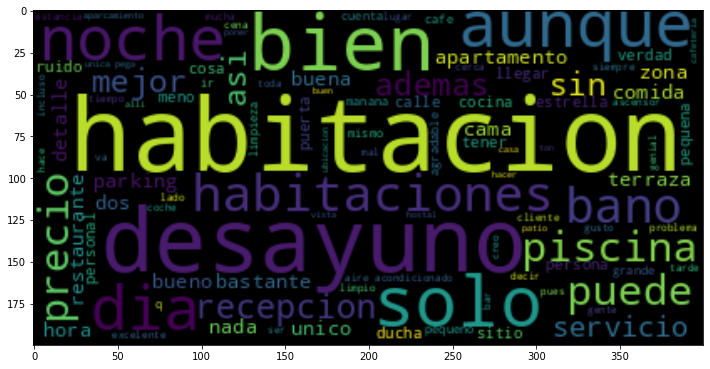

In [32]:
generate_wordcloud(cluster_3)

In [63]:
df_positive_sentences.loc[df_positive_sentences['cluster']==3, 'cluster'] = 'amenities'

In [33]:
n_sentences_c3 = len(cluster_3)
n_comments_c3 = cluster_3['review_index'].nunique()
perc_sentences_c3 = round(100*(n_sentences_c3/n_sentences))
perc_comments_c3 = round(100*(n_comments_c3/n_comments))

In [34]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 3: {n_sentences_c3}')
print(f'Percentage of sentences belonging to cluster 3: {perc_sentences_c3}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 3: {n_comments_c3}')
print(f'Percentage of comments that include sentences belonging to cluster 3: {perc_comments_c3}')

Total number of sentences (all clusters): 80885
Number of sentences belonging to cluster 3: 20337
Percentage of sentences belonging to cluster 3: 25
Total number of comments: 16013
Number of comments that include sentences belonging to cluster 3: 10377
Percentage of comments that include sentences belonging to cluster 3: 65


##### **Cluster 4**

In [35]:
cluster_4 = df_positive_sentences[df_positive_sentences['cluster']==4]

In [83]:
cluster_4 = cluster_4.drop(columns=['Unnamed: 0', 'label'])

In [84]:
cluster_4.sample(5)

,text,review_index,text_processed,vec,cluster
23104,Se lo recomiendo a todo el mundo q quiera visi...,5_4108,recomiendo mundo q quiera visitar granada,"[-0.11381416, 0.22003946, 0.08543025, -0.05241...",4
676,"TOTALMENTE RECOMENDABLE Sin duda, volveremos",5_123,totalmente recomendable sin duda volveremos,"[-0.13254909, 0.18671265, 0.044890087, -0.0503...",4
31954,"Sin duda, si vuelvo a Córdoba y esta disponibl...",5_5641,sin duda vuelvo cordoba disponible alojamiento...,"[-0.13653678, 0.22369008, 0.03909517, -0.06020...",4
8008,Volveremos!!!!!,5_1442,volveremos,"[-0.05145451, 0.19699547, -0.008444077, -0.052...",4
7153,Si volvemos a Sevilla volveríamos a ir al hotel,5_1286,volvemos sevilla volveriamos ir,"[-0.026997872, 0.11842236, 0.095907, -0.061707...",4


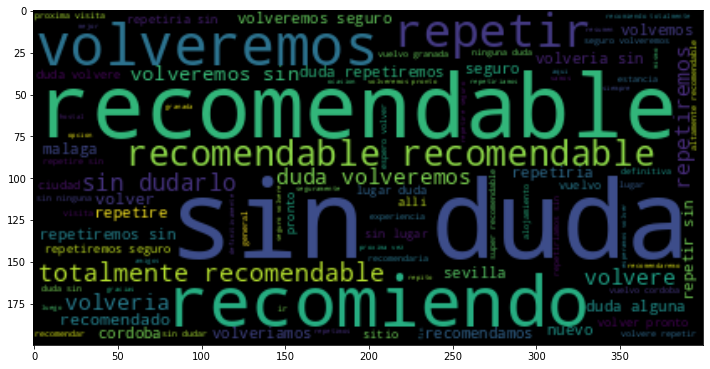

In [37]:
generate_wordcloud(cluster_4)

In [38]:
df_positive_sentences.loc[df_positive_sentences['cluster']==4, 'cluster'] = 'recommend and revisit'

In [39]:
n_sentences_c4 = len(cluster_4)
n_comments_c4 = cluster_4['review_index'].nunique()
perc_sentences_c4 = round(100*(n_sentences_c4/n_sentences))
perc_comments_c4 = round(100*(n_comments_c4/n_comments))

In [40]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 4: {n_sentences_c4}')
print(f'Percentage of sentences belonging to cluster 4: {perc_sentences_c4}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 4: {n_comments_c4}')
print(f'Percentage of comments that include sentences belonging to cluster 4: {perc_comments_c4}')

Total number of sentences (all clusters): 80885
Number of sentences belonging to cluster 4: 5101
Percentage of sentences belonging to cluster 4: 6
Total number of comments: 16013
Number of comments that include sentences belonging to cluster 4: 4477
Percentage of comments that include sentences belonging to cluster 4: 28


##### **Cluster 5**

In [41]:
cluster_5 = df_positive_sentences[df_positive_sentences['cluster']==5]

In [85]:
cluster_5 = cluster_5.drop(columns=['Unnamed: 0', 'label'])

In [86]:
cluster_5.head(5)

,text,review_index,text_processed,vec,cluster
9,La verdad es que todo perfecto,5_1,verdad perfecto,"[0.04380781, 0.09349876, 0.029281616, 0.005535...",5
22,Mejor hotel de ciudad en Sevilla,5_4,mejor ciudad sevilla,"[-0.037221894, 0.1476326, 0.19444494, -0.05056...",5
23,Si estás buscando un hotel para alojarte en el...,5_4,buscando alojarte centro sevilla cumplira expe...,"[-0.08224686, 0.1683038, 0.008509572, 0.001757...",5
33,"Como todos los hoteles de la cadena, un 10",5_6,hoteles cadena 10,"[-0.028545551, 0.21358411, 0.18308413, -0.0477...",5
46,Veo que los precios fluctúan mucho en función ...,5_7,veo precios fluctuan funcion dias semana elegi...,"[-0.13229294, 0.17396596, 0.07667083, -0.00466...",5


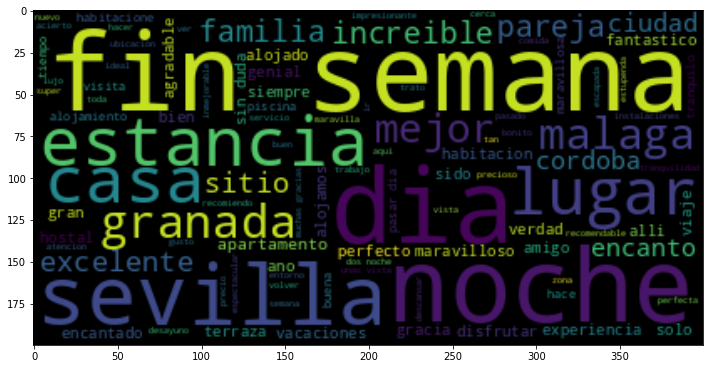

In [43]:
generate_wordcloud(cluster_5)

In [44]:
df_positive_sentences.loc[df_positive_sentences['cluster']==5, 'cluster'] = 'experience'

In [45]:
n_sentences_c5 = len(cluster_5)
n_comments_c5 = cluster_5['review_index'].nunique()
perc_sentences_c5 = round(100*(n_sentences_c5/n_sentences))
perc_comments_c5 = round(100*(n_comments_c5/n_comments))

In [46]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 5: {n_sentences_c5}')
print(f'Percentage of sentences belonging to cluster 5: {perc_sentences_c5}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 5: {n_comments_c5}')
print(f'Percentage of comments that include sentences belonging to cluster 5: {perc_comments_c5}')

Total number of sentences (all clusters): 80885
Number of sentences belonging to cluster 5: 14978
Percentage of sentences belonging to cluster 5: 19
Total number of comments: 16013
Number of comments that include sentences belonging to cluster 5: 8370
Percentage of comments that include sentences belonging to cluster 5: 52


##### **Cluster 6**

In [47]:
cluster_6 = df_positive_sentences[df_positive_sentences['cluster']==6]

In [87]:
cluster_6 = cluster_6.drop(columns=['Unnamed: 0', 'label'])

In [88]:
cluster_6.sample(5)

,text,review_index,text_processed,vec,cluster
463,Para acceder al centro (catedral) aparte de ta...,5_82,acceder centro catedral aparte taxis autobuses...,"[-0.08163159, 0.16984446, 0.0975524, -0.036165...",6
50333,Ademas el hotel está situado en el barrio de S...,5_8643,ademas situado barrio santa cruz par manzanas ...,"[-0.07634446, 0.10937054, 0.1385138, -0.003857...",6
68716,Pero sí estas de paso es perfecto por el rápid...,4_1552,paso perfecto rapido facil acceso des autovia,"[-0.039134976, 0.1466496, 0.027890123, -0.0546...",6
75825,Muy céntrico,4_3135,centrico,"[-0.029608632, 0.12280897, 0.09747084, 0.09069...",6
59228,"y cerca de la autovía , sales enseguida!!!",3_1466,cerca autovia sales enseguida,"[-0.11396226, 0.1251882, 0.11788467, -0.011906...",6


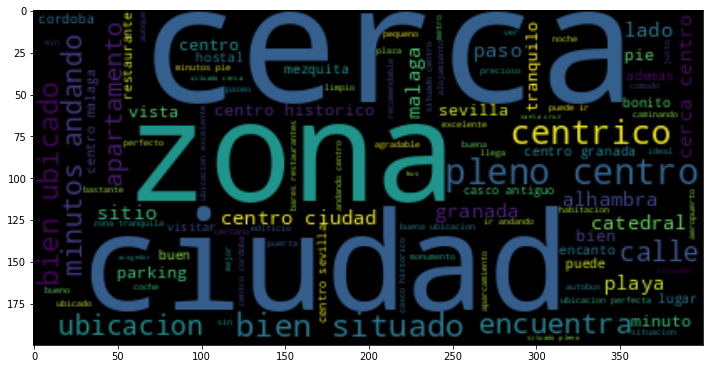

In [49]:
generate_wordcloud(cluster_6)

In [50]:
df_positive_sentences.loc[df_positive_sentences['cluster']==6, 'cluster'] = 'location'

In [51]:
n_sentences_c6 = len(cluster_6)
n_comments_c6 = cluster_6['review_index'].nunique()
perc_sentences_c6 = round(100*(n_sentences_c6/n_sentences))
perc_comments_c6 = round(100*(n_comments_c6/n_comments))

In [52]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 6: {n_sentences_c6}')
print(f'Percentage of sentences belonging to cluster 6: {perc_sentences_c6}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 6: {n_comments_c6}')
print(f'Percentage of comments that include sentences belonging to cluster 6: {perc_comments_c6}')

Total number of sentences (all clusters): 80885
Number of sentences belonging to cluster 6: 10081
Percentage of sentences belonging to cluster 6: 12
Total number of comments: 16013
Number of comments that include sentences belonging to cluster 6: 7247
Percentage of comments that include sentences belonging to cluster 6: 45


##### **Cluster 7**

In [53]:
cluster_7 = df_positive_sentences[df_positive_sentences['cluster']==7]

In [89]:
cluster_7 = cluster_7.drop(columns=['Unnamed: 0', 'label'])

In [91]:
cluster_7.sample(5)

,text,review_index,text_processed,vec,cluster
62636,Volver a the corner house es como volver a casa,4_170,volver the corner house volver casa,"[-0.051001728, 0.22545247, -0.05018074, -0.082...",7
41525,Casa de Vides is situated in a tiny village ne...,5_7230,casa vides is situated in tiny village near al...,"[-0.051696263, 0.2058718, -0.03315382, -0.0910...",7
34765,Parfait pour visiter Codoba,5_6129,parfait pour visiter codoba,"[-0.08971737, 0.19639948, 0.024390452, -0.0928...",7
73473,Bij het huis is een gemeenschappelijk zwembad,4_2624,bij het huis is een gemeenschappelijk zwembad,"[-0.05876649, 0.19743153, -0.09949586, -0.0819...",7
38991,Best B&B in the Southern Spain,5_6831,best bb in the southern spain,"[-0.057850666, 0.22953144, -0.12202005, -0.105...",7


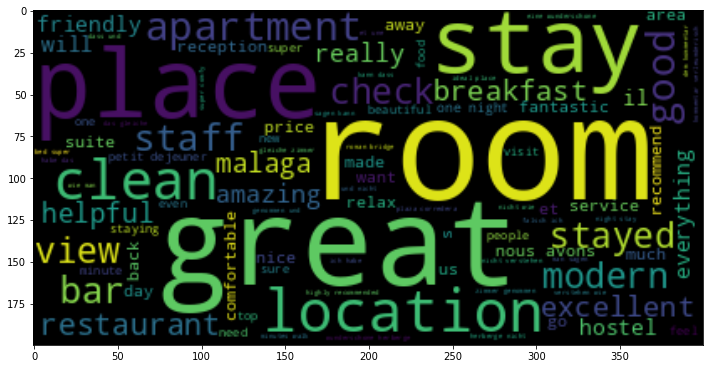

In [57]:
generate_wordcloud(cluster_7)

In [58]:
df_positive_sentences.loc[df_positive_sentences['cluster']==7, 'cluster'] = 'review not in spanish'

In [59]:
n_sentences_c7 = len(cluster_7)
n_comments_c7 = cluster_7['review_index'].nunique()
perc_sentences_c7 = round(100*(n_sentences_c7/n_sentences))
perc_comments_c7 = round(100*(n_comments_c7/n_comments))

In [60]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 7: {n_sentences_c7}')
print(f'Percentage of sentences belonging to cluster 7: {perc_sentences_c7}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 7: {n_comments_c7}')
print(f'Percentage of comments that include sentences belonging to cluster 7: {perc_comments_c7}')

Total number of sentences (all clusters): 80885
Number of sentences belonging to cluster 7: 1850
Percentage of sentences belonging to cluster 7: 2
Total number of comments: 16013
Number of comments that include sentences belonging to cluster 7: 582
Percentage of comments that include sentences belonging to cluster 7: 4


##### **Save csv**

In [93]:
df_positive_sentences.to_csv('../data/processed/positive_sentences_clusters.csv')

In [3]:
# Read csv
df_positive_sentences = pd.read_csv('../data/processed/positive_sentences_clusters.csv')

##### **Comments and sentences distribution**

In [15]:
clusters = list(df_positive_sentences['cluster'].unique())
n_comments = []
for cluster in clusters:
    n_comm = df_positive_sentences[df_positive_sentences['cluster']==cluster]['review_index'].nunique()
    n_comments.append(n_comm)

In [16]:
df_clusters = pd.DataFrame({'cluster':clusters, 'n_comments':n_comments})

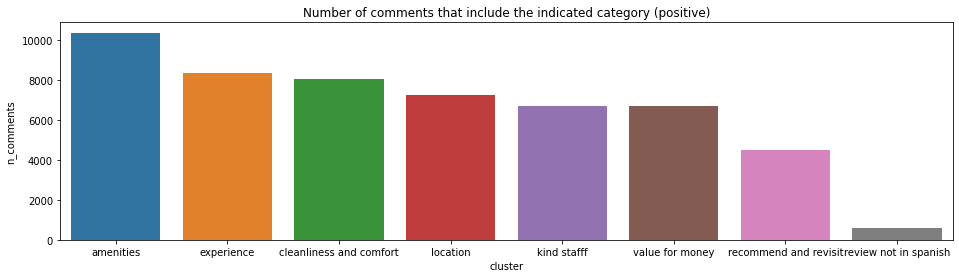

In [17]:
plt.figure(figsize=(16,4))
sns.barplot(data=df_clusters, x='cluster', y='n_comments', order=df_clusters.sort_values('n_comments', ascending=False).cluster)
plt.title('Number of comments that include the indicated category (positive)')
plt.show()

##### **Clusters visualization**

In [97]:
# Main components to make 3D plot
pca = PCA(n_components=3)
df_positive_sentences['x'] = pca.fit_transform(df_positive_sentences['vec'].values.tolist())[:,0]
df_positive_sentences['y'] = pca.fit_transform(df_positive_sentences['vec'].values.tolist())[:,1]
df_positive_sentences['z'] = pca.fit_transform(df_positive_sentences['vec'].values.tolist())[:,2]

In [98]:
df_positive_sentences['cluster'] = df_positive_sentences['cluster'].astype('category')

In [99]:
fig = px.scatter_3d(df_positive_sentences, x='x', y='y', z='z', color='cluster')
fig.update_traces(marker_size = 2)
fig.show()
# Image saved in the "images" folder

Reference:
https://towardsdatascience.com/making-sense-of-text-clustering-ca649c190b20#:~:text=For%20a%20refresh%2C%20clustering%20is,learn%20the%20pattern%20by%20itself.